# Context
Data processing associated with [Stefan's data collection](https://egnyte.nhgh.org/app/index.do#storage/files/1/Shared/Projects/Pediatric%20Pulse%20ROxi/alg%20development/Bench%20data%20for%20Nigeria%20study/Aug%2015) done on Aug 15, 2023, where the goal is to characterise the relationship between PPG waveforms and the pressure applied to the sensor, as well as loose vs tight application of the bandaid-style sensor.

`timestamps.xlsx` is a manually annotated file with timestamp information corresponding to the data collection.

[Notes on Confluence](https://nhgh.atlassian.net/wiki/spaces/PSP/pages/1452572707/Aug+15+Experiments)

A metronome was used to keep breath steady
A mask with pressure sensor was worn

## Parameters
* Background (no movement)
* Pressure on sensor: none/light/medium/hard
* Sensor on fingertip: loose/tight
  

## Equipment Used
* band-aid style ppg probe
* BMA

timestamps from video was converted to BMA timestamp with
`=FLOOR(B3,1)*60+(B3-TRUNC(B3))*100-$J$2`


In [1]:
import plotly.express as px
import pandas as pd
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

from ppg2rr import signal_quality as sqi
from ppg2rr import util, riv_est
from ppg2rr.rr_est import estimate_rr_single_frame

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
exp_directory = '../data/bench/20230815 physical pressure/'

# Load Data & Time-Sync

In [4]:

# manual annotations with timings and parameters
timing_df = pd.read_excel(f'{exp_directory}/timestamps.xlsx')
timing_df = timing_df[['Run','Start BMA','End BMA','Strap','Pressure']]
timing_df['duration'] = timing_df['End BMA']-timing_df['Start BMA']

In [5]:
timing_df

,Run,Start BMA,End BMA,Strap,Pressure,duration
0,0,46.0,71.0,loose,NaN,25.0
1,1,105.0,122.0,loose,light,17.0
2,2,122.0,139.0,loose,medium,17.0
3,3,140.0,154.0,loose,hard,14.0
4,4,156.0,180.0,loose,NaN,24.0
5,5,180.0,196.0,loose,light,16.0
6,6,197.0,211.0,loose,medium,14.0
7,7,212.0,227.0,loose,hard,15.0
8,8,254.0,272.0,tight,NaN,18.0
9,9,280.0,298.0,tight,light,18.0


## NH Custom Hardware

In [6]:
bma_file_timestamp = '2023-08-15 16:40:15'
df = pd.read_csv(f'{exp_directory}/BMA400_2023-08-15_16-40-15.csv')
df['ppg'] = -df['ppg'] # flip ppg direction to get the appropriate shape
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110402 entries, 0 to 110401
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ppg_counter           110402 non-null  int64  
 1   ppg_us                110402 non-null  int64  
 2   ppg_agc_stable        110402 non-null  int64  
 3   ppg_led_drive_levels  110402 non-null  int64  
 4   ppg                   110402 non-null  int64  
 5   ppg_in_waiting        110402 non-null  int64  
 6   x1                    110402 non-null  float64
 7   y1                    110402 non-null  float64
 8   z1                    110402 non-null  float64
 9   x2                    110402 non-null  float64
 10  y2                    110402 non-null  float64
 11  z2                    110402 non-null  float64
 12  force                 110402 non-null  float64
 13  ser1.in_waiting       110402 non-null  int64  
 14  pressure              110402 non-null  float64
 15  

In [7]:
# add timestamp info to the main data file
df = df.assign(run=None,note=None)
for idx, row in timing_df.iterrows():
    selector = df['elapsed_time_ms'].between(row['Start BMA']*1000,row['End BMA']*1000) 
    df.loc[selector,'run'] =  row['Run']
    df.loc[selector,'Strap'] = row['Strap']
    df.loc[selector,'Contact Pressure'] = row['Pressure']


# datetime is estimated using the filename
df['datetime'] = pd.to_datetime(bma_file_timestamp) + pd.to_timedelta(df['elapsed_time_ms'], unit='ms')

In [8]:
df = df.fillna(np.nan)
df.sample(10)

,ppg_counter,ppg_us,ppg_agc_stable,ppg_led_drive_levels,ppg,ppg_in_waiting,x1,y1,z1,x2,...,ser1.in_waiting,pressure,pressure_clock_ms,ser2.in_waiting,elapsed_time_ms,run,note,Strap,Contact Pressure,datetime
100437,12157,280464624,1,40,-1012508,0,-0.529,-0.376,0.732,0.317,...,0,2.5269,401857,0,403329.244,14.0,NaN,tight,medium,2023-08-15 16:46:58.329244
5378,48170,4195214726,1,21,-357256,0,-0.528,-0.373,0.733,0.316,...,0,2.5269,21543,0,23119.165,NaN,NaN,NaN,NaN,2023-08-15 16:40:38.119165
39597,16853,37116661,1,21,-343014,0,-0.528,-0.375,0.731,0.315,...,0,2.5269,158447,0,159985.390,4.0,NaN,loose,NaN,2023-08-15 16:42:54.985390
107424,19144,308411242,1,40,-848355,0,-0.529,-0.379,0.729,0.316,...,0,2.5220,429813,0,431275.367,NaN,NaN,NaN,NaN,2023-08-15 16:47:26.275367
107309,19029,307951265,1,40,-888381,0,-0.528,-0.377,0.730,0.317,...,0,2.5073,429352,0,430815.367,NaN,NaN,NaN,NaN,2023-08-15 16:47:25.815367
4778,47570,4192814844,1,21,-363259,600,-0.529,-0.374,0.731,0.316,...,0,2.5269,19164,140,20799.964,NaN,NaN,NaN,NaN,2023-08-15 16:40:35.799964
110080,21800,319034717,1,40,-793863,0,-0.527,-0.376,0.732,0.317,...,0,2.5220,440435,0,441898.638,NaN,NaN,NaN,NaN,2023-08-15 16:47:36.898638
30291,7547,4294861798,1,21,-507653,0,-0.529,-0.374,0.733,0.315,...,0,2.5269,121216,0,122763.850,2.0,NaN,loose,medium,2023-08-15 16:42:17.763850
29971,7227,4293581861,1,21,-477382,0,-0.528,-0.376,0.732,0.316,...,0,2.5269,119936,0,121484.705,1.0,NaN,loose,light,2023-08-15 16:42:16.484705
27326,4582,4283002385,1,21,-343319,0,-0.529,-0.375,0.733,0.317,...,0,2.5024,109353,0,110904.653,1.0,NaN,loose,light,2023-08-15 16:42:05.904653


In [9]:
smoothed_pressure = signal.medfilt(df['pressure'],75)
df['smoothed_pressure'] = smoothed_pressure

# Visualize Data

In [10]:
# helper function to visualize data
fs = 250
df.shape[0]/fs/60 #minutes; sense-checking if fs is correct

def make_figure(df_all, target, subset=None, start=None, fs=250, duration=30, legend=True, show=True):
    """
    Args:
        subset: boolean array to select a subset of df_all
        target: target column to display
        start: index to zoom in on, seconds
        fs: sampling frequency, Hz
        duration: together with "start" and "fs", sets the the x axis limit.
        
    Returns:
        ppg array specified with subset
    """

    
    if subset is not None:
        subset = df_all['datetime'].between(
            df_all.loc[subset,'datetime'].iloc[0],
            df_all.loc[subset,'datetime'].iloc[-1]
            )
        df = df_all[subset]
    else:
        df = df_all
        
    if show:
        plt.figure(figsize=(15,5))
        plt.plot(df[target],color="#8870ff", linewidth=0.5)
        runs = timing_df['Run'].unique()
        for run in runs:
            df_run = timing_df[timing_df['Run']==run]
            label = f"""
                pressure: {df_run['Pressure'].iloc[0]}, 
                strap: {df_run['Strap'].iloc[0]}
                """
            plt.plot(df[(df['run']==run)][target], label=label)
            # plt.plot(df[(df['run']==run)][target], color='#FF7E00')
            # plt.plot(df[(df['run']==run)][target], color='#03C03C')
            # plt.plot(df[(df['run']==run)][target], color='#B31B1B')
        plt.ylabel(target)

        if legend:
            # legend proxies   
            # plt.plot([], label = 'no motion; normal breathing', color='#1F75FE')
            # plt.plot([], label = 'motion; normal breathing', color='#FF7E00')
            # plt.plot([], label = 'no motion; deep breathing', color='#03C03C')
            # plt.plot([], label = 'motion; deep breathing', color='#B31B1B')

            plt.legend()
        
        if start is not None:
            frame_len = fs*duration
            end = start*fs + frame_len
            plt.xlim(start*fs,end)
            
        
        plt.show()
    
    return df[target]

In [11]:
# use "subset" to view specific runs, or remove the argument to see the entire file
run = 0
subset = (df['run'] == run)
nh_subset = df['datetime'].between(min(df.loc[subset,'datetime']),max(df.loc[subset,'datetime']))
fig = px.line(y=df[nh_subset]['ppg'], title='NH hardware')
fig.show()

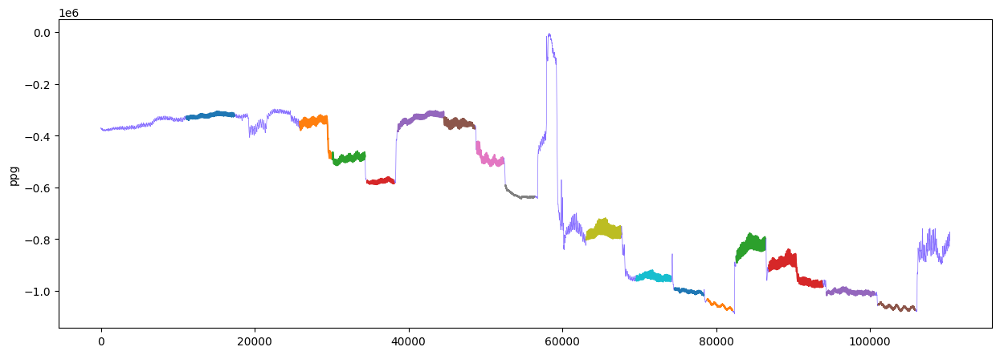

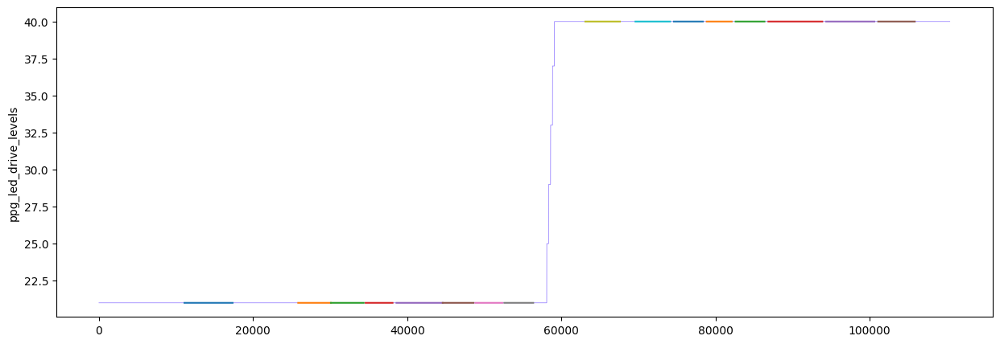

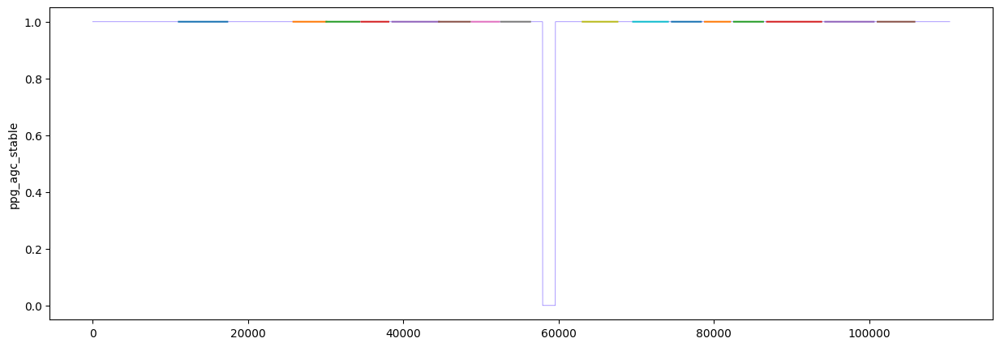

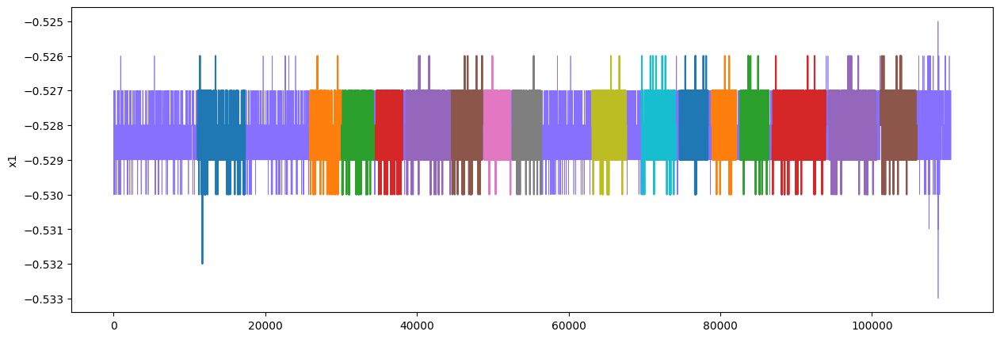

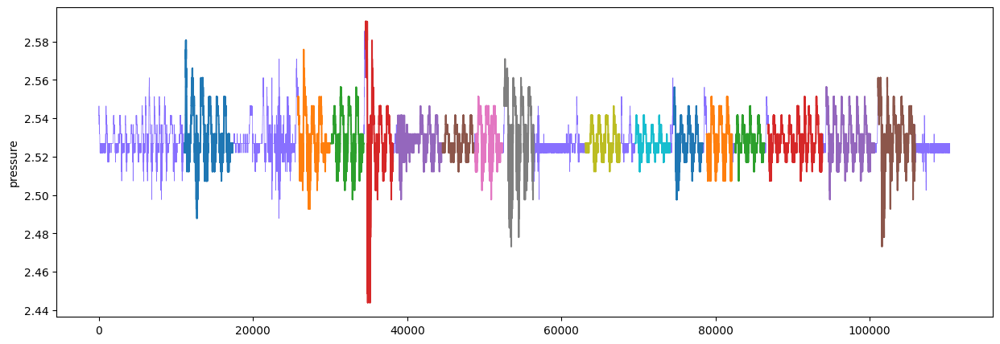

In [13]:
# Phil's hardware 
# run = [11]
# subset = (df['run'].isin(run)) # view data from a specific run

# adjust start, duration, and subset to view different segments
# start = 30
subset = None
# duration = 60
start= None
# start=None
duration = 200

ppg_nh = make_figure(df,'ppg',subset=subset,start=start,duration=duration, legend=False)
_ = make_figure(df,'ppg_led_drive_levels',subset=subset,start=start,duration=duration, legend=False)
_ = make_figure(df,'ppg_agc_stable',subset=subset,start=start,duration=duration, legend=False)
accel = make_figure(df,'x1',subset=subset,start=start,duration=duration, legend=False)
_ = make_figure(df,'pressure',subset=subset,start=start,duration=duration, legend=False)

In [13]:
timing_df

,Run,Start BMA,End BMA,Strap,Pressure,duration
0,0,46.0,71.0,loose,NaN,25.0
1,1,105.0,122.0,loose,light,17.0
2,2,122.0,139.0,loose,medium,17.0
3,3,140.0,154.0,loose,hard,14.0
4,4,156.0,180.0,loose,NaN,24.0
5,5,180.0,196.0,loose,light,16.0
6,6,197.0,211.0,loose,medium,14.0
7,7,212.0,227.0,loose,hard,15.0
8,8,254.0,272.0,tight,NaN,18.0
9,9,280.0,298.0,tight,light,18.0


## Compare PPG waveforms for each run

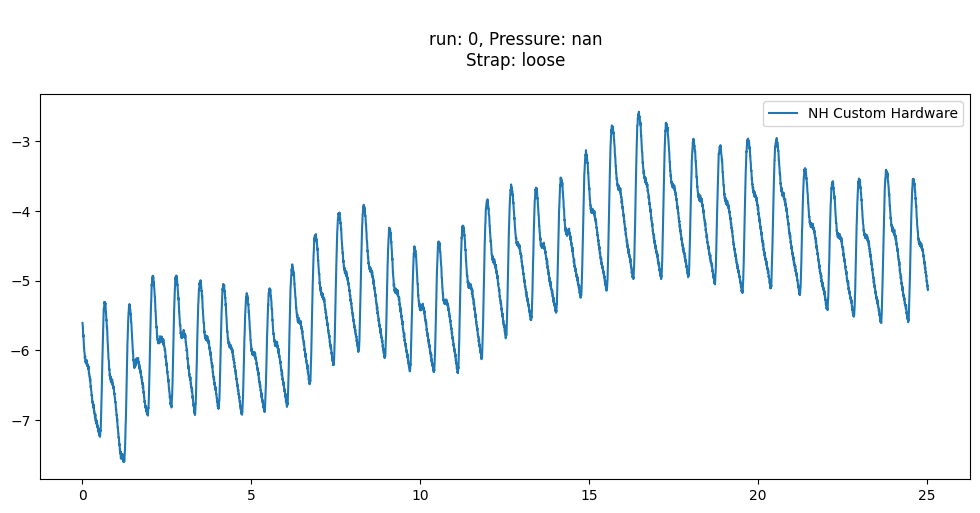

,feature,skew,kurtosis
0,RIFV_max,0.633401,0.445528
1,RIFV_min,1.133432,0.433561
2,RIFV_mas,0.853628,0.284172
3,AUDP,0.363531,0.333347
4,RIIV_upper,0.244537,0.967800
5,RIIV_lower,-1.892017,6.998124
6,RIAV_ascending,0.085262,-1.327930
7,RIAV_descending,-0.257982,0.466524
8,STT,-0.060866,-1.213119
9,notch area ratio,1.729547,4.665965


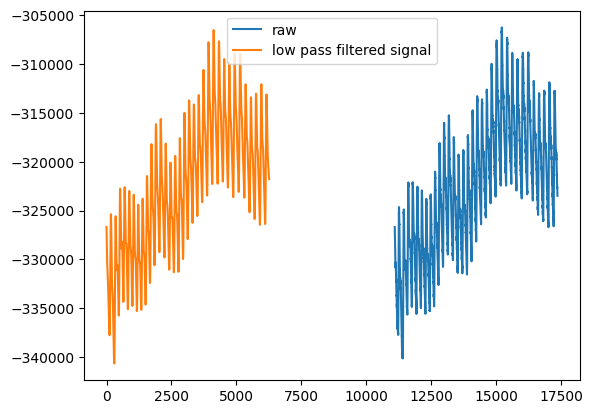

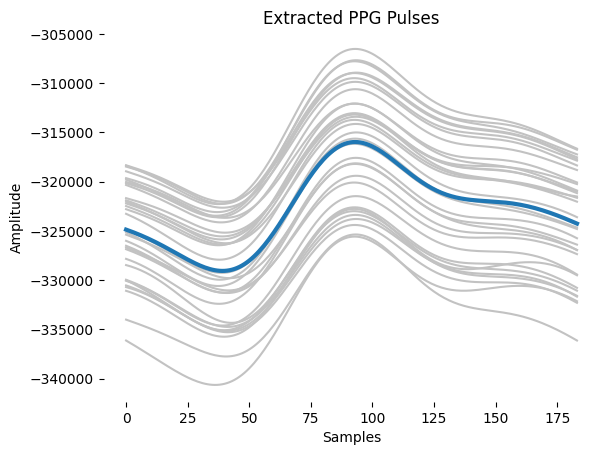

{'corrcoef mean': 0.9942698435524617,
 'corrcoef std': 0.0076435886016233395,
 'cosine mean': 0.9999959388045406,
 'cosine std': 3.239520425940175e-06,
 'xcorr mean': 0.9999977345704031,
 'xcorr std': 2.074315096025423e-06}

,feature,rr candidate median delta,rr_candidates_count,std
0,RIFV_max,13.63,17.65,3.7757
1,RIFV_min,14.49,22.06,1.0649
2,RIFV_mas,14.35,22.06,1.1349
3,AUDP,13.85,22.14,1.7306
4,RIIV_upper,14.14,21.51,1.7603
5,RIIV_lower,10.42,12.90,3.1984
6,RIAV_ascending,14.97,25.81,2.1087
7,RIAV_descending,14.64,22.14,1.2905
8,STT,14.19,22.14,1.9309
9,notch area ratio,11.96,22.14,8.9711


[28.7109375 21.6796875 35.7421875]
[0.67434982 0.36951275 0.0845826 ]
[28.7109375 21.09375  ]
[0.94586592 0.43875611]
[28.7109375 21.09375   35.15625  ]
[0.82616288 0.37496663 0.08472954]
[28.125   18.75    35.15625]
[0.70502632 0.17066746 0.07089073]
[28.125     12.3046875]
[1.         0.92929982]
[26.953125  21.6796875 33.3984375]
[0.54746532 0.34759877 0.13256552]
[27.5390625 21.6796875 14.6484375]
[1.         0.41034456 0.30821053]
[28.7109375]
[1.]
[26.953125 12.890625 19.921875]
[1.         0.3911344  0.32699807]
[19.3359375 26.3671875 12.890625 ]
[1.         0.35378382 0.18760646]
[19.3359375 26.953125  43.359375 ]
[1.         0.50610424 0.22726405]
[12.3046875 27.5390625 33.984375 ]
[0.95779275 0.79394956 0.14736139]
[27.5390625]
[1.]


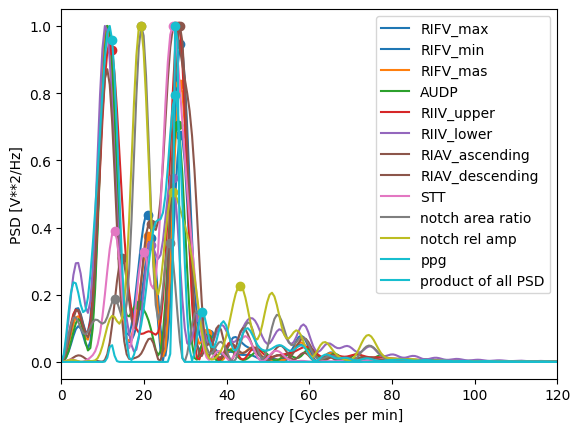

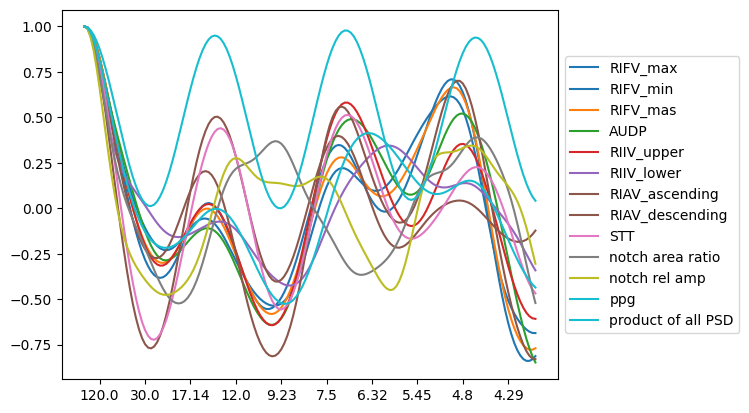

,original candidate,max psd freqs,RQIs,acf RRs,acf peak
RIFV_max,28.71,28.71,0.1866,"[9.92, 14.12]","[0.62, 0.22]"
RIFV_min,28.71,28.71,0.2362,"[9.92, 14.29, 29.27]","[0.71, 0.35, 0.03]"
RIFV_mas,28.71,28.71,0.2217,"[9.84, 14.12]","[0.67, 0.28]"
AUDP,28.12,28.12,0.2197,"[9.6, 13.64]","[0.52, 0.49]"
RIIV_upper,28.12,28.12,0.2501,"[13.95, 9.6, 29.27]","[0.58, 0.35, 0.02]"
RIIV_lower,26.95,26.95,0.1370,"[12.0, 9.52]","[0.34, 0.14]"
RIAV_ascending,27.54,27.27,0.2783,"[27.27, 14.29, 9.68]","[0.5, 0.4, 0.04]"
RIAV_descending,28.71,28.71,0.3092,"[9.76, 14.12, 30.0]","[0.7, 0.56, 0.2]"
STT,26.95,26.67,0.3125,"[13.79, 26.67, 9.23]","[0.51, 0.44, 0.23]"
notch area ratio,19.34,19.34,0.3224,"[9.23, 19.05]","[0.39, 0.37]"


RIFV_max: [28.71 21.68 35.74][0.03749177 0.02054377 0.00470253]
RIFV_min: [28.71 21.09][0.04595016 0.02131477]
RIFV_mas: [28.71 21.09 35.16][0.04362805 0.01980126 0.0044744 ]
AUDP: [28.12 18.75 35.16][0.0423848  0.01026019 0.00426181]
RIIV_upper: [28.12 12.3 ][0.04780752 0.04442752]
RIIV_lower: [26.95 21.68 33.4 ][0.02565231 0.01628726 0.00621156]
RIAV_ascending: [27.54 21.68 14.65][0.04904143 0.02012388 0.01511509]
RIAV_descending: [28.71][0.05907451]
STT: [26.95 12.89 19.92][0.05665387 0.02215928 0.01852571]
notch area ratio: [19.34 26.37 12.89][0.06255731 0.02213176 0.01173616]
notch rel amp: [19.34 26.95 43.36][0.04571613 0.02313713 0.01038963]
ppg: [12.3  27.54 33.98][0.04416133 0.03660695 0.00679445]
product of all PSD: [27.54][0.3725887]
[22.8515625 14.0625    26.3671875]
[1.         0.67209058 0.39347091]
[22.8515625 26.3671875 14.0625   ]
[1.         0.50336561 0.27478389]
[22.8515625  26.3671875  29.58984375]
[1.         0.62412397 0.3936494 ]
[22.8515625 26.3671875]
[1.     

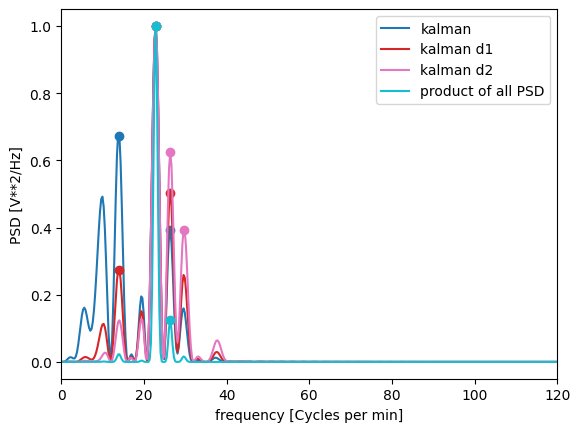

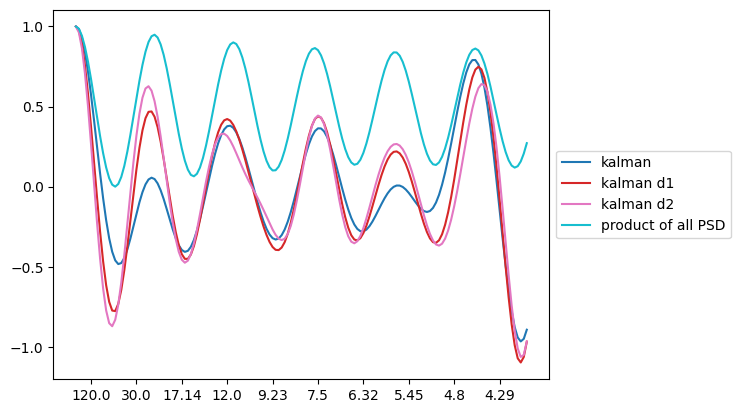

,original candidate,max psd freqs,RQIs,acf RRs,acf peak
kalman,22.85,22.85,0.2527,"[11.76, 24.0]","[0.38, 0.06]"
kalman d1,22.85,22.85,0.3338,"[24.0, 12.0]","[0.47, 0.42]"
kalman d2,22.85,22.85,0.3283,"[25.0, 12.24]","[0.63, 0.33]"
product of all PSD,22.85,22.85,0.8166,"[23.08, 11.54]","[0.95, 0.9]"


kalman: [22.85 14.06 26.37][0.04986415 0.03351323 0.01962009]
kalman d1: [22.85 26.37 14.06][0.06597263 0.03320835 0.01812821]
kalman d2: [22.85 26.37 29.59][0.06500732 0.04057263 0.02559009]
product of all PSD: [22.85 26.37][0.21105289 0.02608905]
median RR based on fused waveform pk time-delta: 22.0
fused waveform peak count per min: 14
kalman seed:  21.09375
harmonic result:  22.8515625
RR kalman:  22.8515625


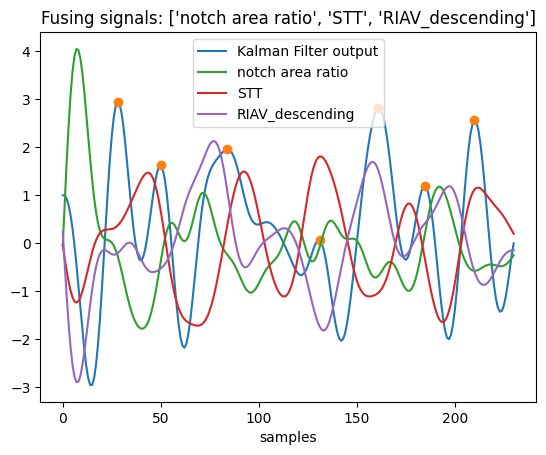

In [19]:
# manually adjust id between 015, 016, and 017, as well as P1 and P2
def standardize(data):
    return (data-np.mean(data))/np.std(data)

# runs = timing_df['Run'].unique()
runs = [0]
valid_run = []
run_label = []
rr_est1 = []
rr_est2 = []

for run in runs:
    subset = (df['run'] == run)

    # make axes and plot figures
    nh_subset_ppg = df[subset]['ppg']
    
    x_nh = np.arange(0,len(nh_subset_ppg))/250
    title = f"""
    run: {run}, Pressure: {timing_df[timing_df['Run']==run]['Pressure'].iloc[0]}
    Strap: {timing_df[timing_df['Run']==run]['Strap'].iloc[0]}
    """
    
    plt.figure(figsize=(12,5))
    plt.plot(x_nh,standardize(nh_subset_ppg)-5, label = 'NH Custom Hardware')
    plt.title(title)
    plt.legend()
    plt.show()
    
    # Also do RR estimation with algorithm
    labels = ['NH Custom']
    ppgs = [nh_subset_ppg]
    fss = [250]
    for ppg,fs,label in zip(ppgs,fss,labels):
        # ppg_lp = util.lowpass_butter(ppg,250,5/60)
        # ppg_hp = ppg-ppg_lp
        (
        rr_candidate_merged,
        all_rr_candidates,
        feature_quality,
        ) = estimate_rr_single_frame(
            ppg=ppg,
            fs_ppg=fs,
            hr_est=70,
            rr_max=70/1.75,
            min_resp_freq=4/60,
            rr_est=20,
            remove_riv_outliers=None,
            fs_riv=20,
            n_sig=3,
            show=True,
        )
            
        valid_run.append(run)
        run_label.append(label)
        rr_est1.append(rr_candidate_merged['kalman'])
        rr_est2.append(rr_candidate_merged['simple median'])
                
results_df = pd.DataFrame({
    "run":valid_run,
    "hardware":run_label,
    "kalman est":rr_est1,
    "simple median est": rr_est2,
})

In [15]:
results2 = results_df.pivot(index='run',columns='hardware',values=['kalman est','simple median est'])


In [16]:
ppg_mean = []
ranges = []
for run in runs:
    subset = (df['run'] == run)

    # make axes and plot figures
    nh_subset_ppg = df[subset]['ppg']
    ppg_mean.append(np.mean(nh_subset_ppg))
    ranges.append(np.max(nh_subset_ppg)-np.min(nh_subset_ppg))

In [17]:
results2['Contact Pressure'] = timing_df['Pressure']
results2['Strap'] = timing_df['Strap']
results2['ppg mean'] = ppg_mean
results2['ppg range'] = ranges
results2

,kalman est,simple median est,Contact Pressure,Strap,ppg mean,ppg range
hardware,NH Custom,NH Custom,,,,
run,,,,,,
0,22.851562,19.920,NaN,loose,-3.225850e+05,33851
1,22.851562,14.540,light,loose,-3.630267e+05,171617
2,15.527344,16.410,medium,loose,-4.892771e+05,55825
3,16.992188,18.750,hard,loose,-5.777588e+05,28929
4,23.730469,19.920,NaN,loose,-3.312175e+05,79318
5,14.648438,15.525,light,loose,-3.536416e+05,47605
6,15.820312,18.750,medium,loose,-4.922767e+05,96260
7,17.578125,16.990,hard,loose,-6.307900e+05,52434


In [18]:
results2.to_csv(f'{exp_directory}/evaluation_results_contact_pressure_20230817.csv')

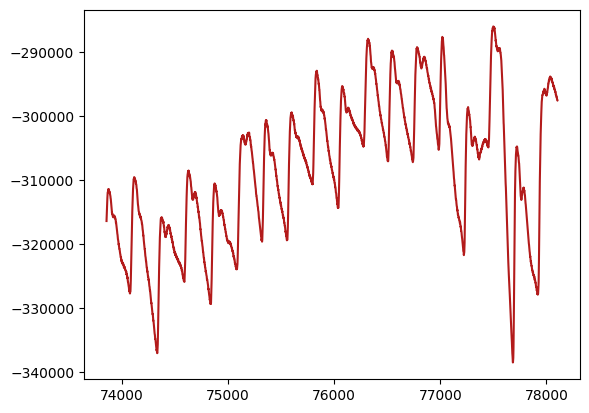

In [46]:
# Manually pull out figures for presentation
subset = (df['run']==6) # view data from a specific run
ppg_nh = make_figure(df,'ppg',subset=subset,legend=False, show=False)
plt.plot(ppg_nh, color="#B31B1B")
# plt.ylim([-.85,-.6])

# Save data if desired
# nh_subset_ppg.to_csv('ppg_example.csv', index=False)

In [16]:
subset = (df['run']==5) # view data from a specific run
ppg_nh = make_figure(df,'ppg',subset=subset,legend=False, show=False)

(
rr_candidate_merged,
all_rr_candidates,
feature_quality,
) = estimate_rr_single_frame(
    ppg=ppg_nh.values,
    fs_ppg=250,
    hr_est=70,
    rr_max=70/1.75,
    min_resp_freq=4/60,
    rr_est=20,
    remove_riv_outliers=None,
    fs_riv=10,
    n_sig=3,
    show=False,
)

rr_candidate_merged

{'PSD, closest to prev RR': 16.99,
 'PSD median': 15.53,
 'Counting, median # peaks': 11.9,
 'simple median': 15.53,
 'kalman': 15.52734375,
 'Counting, median pk delta': 15.13}

# Calculate SNR

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(df['smoothed_pressure'][5:],color="#8870ff", linewidth=0.5)
for run in df['run'].unique():
    plt.plot(df[df['run']==run]['smoothed_pressure'])
plt.title('raw pressure')
plt.xlim(110000,110000+50*fs)
plt.show()

In [48]:
# calculate SNR
target_signal = 'x1'

def power(arr):
    # power is equivalent to the mean-squared signal
    arr_centered = arr - np.mean(arr) #remove bias first
    squared_arr = np.square(arr_centered)
    return np.mean(squared_arr)

background_runs = df['run'].isin([0,5])
p_noise = power(df[background_runs][target_signal])

selectors = {
    'small motion':df['run'].isin([1,2,3,6,7,8]),
    'large motion':df['run'].isin([4,9]),
}

conditions = []
snrs = []
for condition, selector in selectors.items():
    runs = df[selector]['run'].unique()
    for run in runs:
        isolated_signal = df[selector & (df['run']==run)][target_signal]
        p_signal = power(isolated_signal)
        snr_db = 10*np.log10(p_signal/p_noise)
        
        conditions.append(condition)
        snrs.append(snr_db)

print(f'SNR (dB) for {target_signal}')
snr_df = pd.DataFrame({'condition':conditions,'snr (dB)':snrs})
snr_df.groupby('condition').agg(['mean', 'std'])

SNR (dB) for x1


snr (dB)          
                   mean       std
condition                        
large motion  22.392139  1.271046
small motion   8.220354  5.631667